##Multilevel Origin-Destination Direct Ridership Model

first load some utility/plotting packages for mixed models

In [56]:
lib <- c("foreign", "nlme", "lme4", "car", "descr", "effects", "xtable", "texreg", "lmtest", "Hmisc", "ggplot2")
require(lib)
lapply(lib, require, character.only=T)

Loading required package: lib
Warning message:
In library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, : there is no package called ‘lib’

[[1]]
[1] TRUE

[[2]]
[1] TRUE

[[3]]
[1] TRUE

[[4]]
[1] TRUE

[[5]]
[1] TRUE

[[6]]
[1] TRUE

[[7]]
[1] TRUE

[[8]]
[1] TRUE

[[9]]
[1] TRUE

[[10]]
[1] TRUE

[[11]]
[1] TRUE

#### include a nice convenience function for plotting random effects courtesy of [caracal](http://stackoverflow.com/users/484139/caracal) from [this post](http://stackoverflow.com/questions/13847936/in-r-plotting-random-effects-from-lmer-lme4-package-using-qqmath-or-dotplot)  

In [2]:
## re = object of class ranef.mer
ggCaterpillar <- function(re, QQ=TRUE, likeDotplot=TRUE) {
  require(ggplot2)
  f <- function(x) {
    pv   <- attr(x, "postVar")
    cols <- 1:(dim(pv)[1])
    se   <- unlist(lapply(cols, function(i) sqrt(pv[i, i, ])))
    ord  <- unlist(lapply(x, order)) + rep((0:(ncol(x) - 1)) * nrow(x), each=nrow(x))
    pDf  <- data.frame(y=unlist(x)[ord],
                       ci=1.96*se[ord],
                       nQQ=rep(qnorm(ppoints(nrow(x))), ncol(x)),
                       ID=factor(rep(rownames(x), ncol(x))[ord], levels=rownames(x)[ord]),
                       ind=gl(ncol(x), nrow(x), labels=names(x)))
    
    if(QQ) {  ## normal QQ-plot
      p <- ggplot(pDf, aes(nQQ, y))
      p <- p + facet_wrap(~ ind, scales="free")
      p <- p + xlab("Standard normal quantiles") + ylab("Random effect quantiles")
    } else {  ## caterpillar dotplot
      p <- ggplot(pDf, aes(ID, y)) + coord_flip()
      if(likeDotplot) {  ## imitate dotplot() -> same scales for random effects
        p <- p + facet_wrap(~ ind)
      } else {           ## different scales for random effects
        p <- p + facet_grid(ind ~ ., scales="free_y")
      }
      p <- p + xlab("Levels") + ylab("Random effects")
    }
    
    p <- p + theme(legend.position="none")
    p <- p + geom_hline(yintercept=0)
    p <- p + geom_errorbar(aes(ymin=y-ci, ymax=y+ci), width=0, colour="black")
    p <- p + geom_point(aes(size=1.2), colour="blue") 
    return(p)
  }
  
  lapply(re, f)
}


#### Read the latest data file from WMATA and remove OD pairs with no ridership

In [3]:
wmata <- read.dta('Data/Collapsed_Example_0616_Hiro1.dta')
wmata <- subset(wmata, log(ridersum) >0)

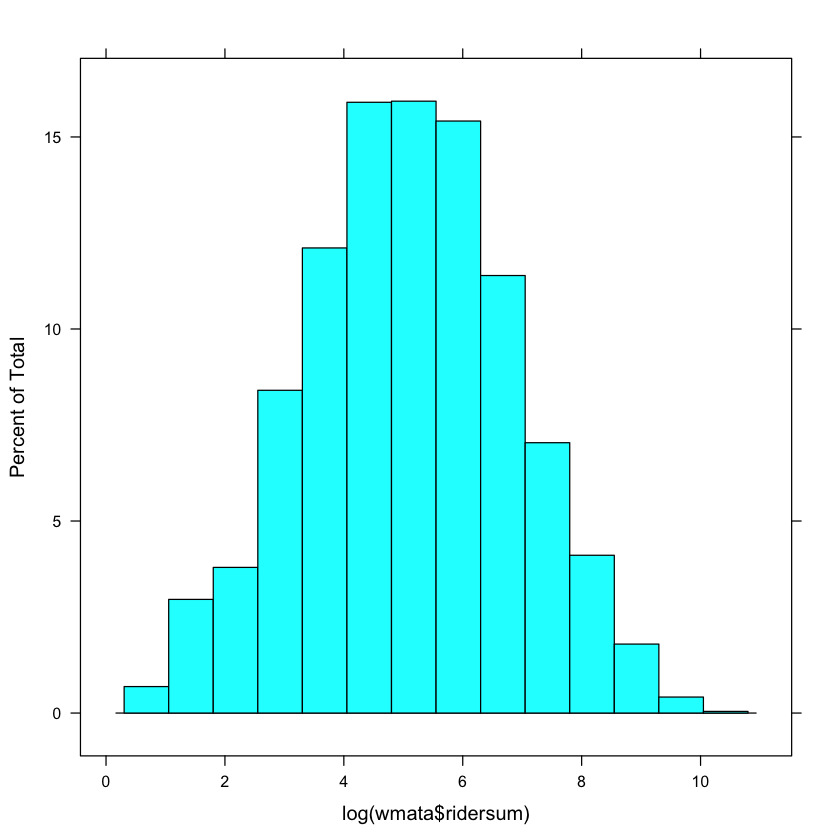

In [58]:
histogram(log(wmata$ridersum))

###Fit some null models:


1. an intercept-only model
2. a model with intercepts that randomly vary by origin station
3. a model with intercepts that randomly vary by destination station
4. a model with 2 random intercepts (origins and destinations)

In [20]:
null_model <- gls( log(ridersum) ~ 1, data=wmata)
null_model_o <- lmer( log(ridersum) ~ 1+ (1 | mstn_id_o), data = wmata)
null_model_d <- lmer( log(ridersum) ~ 1+ (1 | mstn_id_d), data = wmata)
null_model_od <- lmer (log(ridersum) ~ 1 +(1| mstn_id_d) + (1| mstn_id_o), data = wmata)


###Test the null models against one another

first, we test whether each of the models with random intercepts are better than the fixed intercept model

In [23]:
lrtest(null_model, null_model_o)
lrtest(null_model, null_model_d)
lrtest(null_model_o, null_model_d)

Warning message:
In modelUpdate(objects[[i - 1]], objects[[i]]): original model was of class "gls", updated model is of class "lmerMod"

,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,2,-13746.16,NA,NA,NA
2,3,-13311.89,1,868.5514,6.737529e-191


Warning message:
In modelUpdate(objects[[i - 1]], objects[[i]]): original model was of class "gls", updated model is of class "lmerMod"

,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,2,-13746.16,NA,NA,NA
2,3,-11462.13,1,4568.071,0


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,3,-13311.89,NA,NA,NA
2,3,-11462.13,0,3699.52,0


both models are significantly better than the fixed intercept model. Between the three models, the random intercept for destinations seems to explain the most variance. 
    
So far, we know that there are station effects, and that destination effects are larger than origin effects


### Test both random intercept models against the cross classified model

In [54]:
lrtest(null_model_o, null_model_od)
lrtest(null_model_d, null_model_od)

,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,3,-13311.89,NA,NA,NA
2,4,-10221.1,1,6181.568,0


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,3,-11462.13,NA,NA,NA
2,4,-10221.1,1,2482.048,0


In [94]:
htmlreg(list(null_model_o,null_model_d, null_model_od), single.row =TRUE,type="html", custom.model.names = c("Random Origin", "Random Destination","Cross Classified"))

,Random Origin,Random Destination,Cross Classified
(Intercept),5.08 (0.08)***,5.07 (0.14)***,5.05 (0.16)***
AIC,26629.78,22930.26,20450.21
BIC,26650.32,22950.80,20477.60
Log Likelihood,-13311.89,-11462.13,-10221.10
Num. obs.,6961,6961,6961
Num. groups: mstn_id_o,84,,84
Variance: mstn_id_o.(Intercept),0.45,,0.50
Variance: Residual,2.59,1.49,0.99
Num. groups: mstn_id_d,,84,84
Variance: mstn_id_d.(Intercept),,1.58,1.62


likelihood ratio tests show that the cross classified model is significantly better than each of the random intercept models; it also has the smallest residual variance and AIC/BIC

so far so good

### some diagnostic plots:

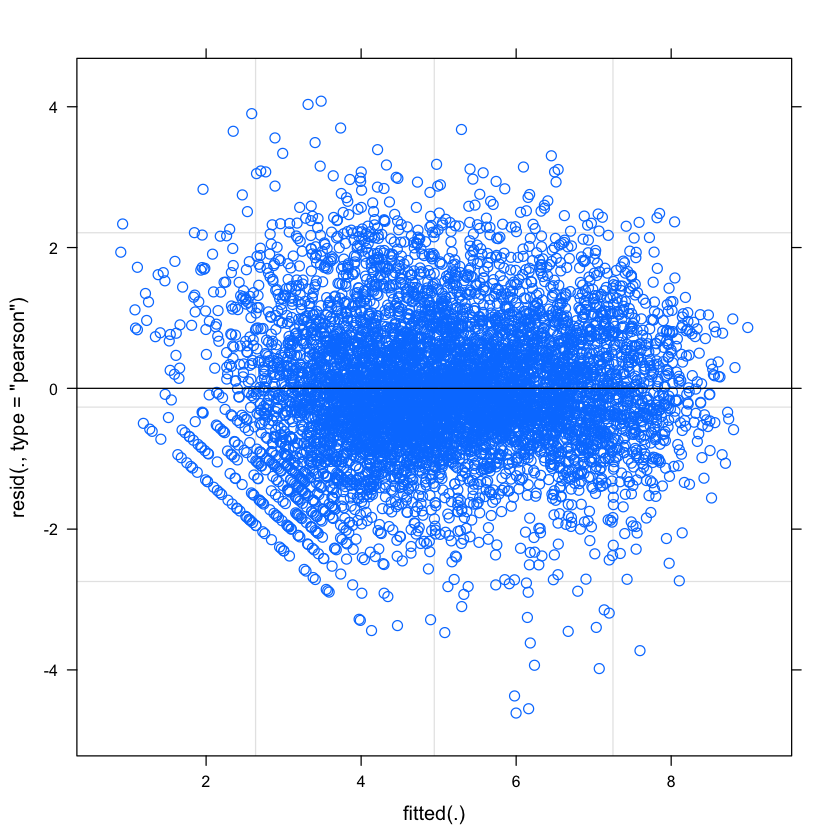

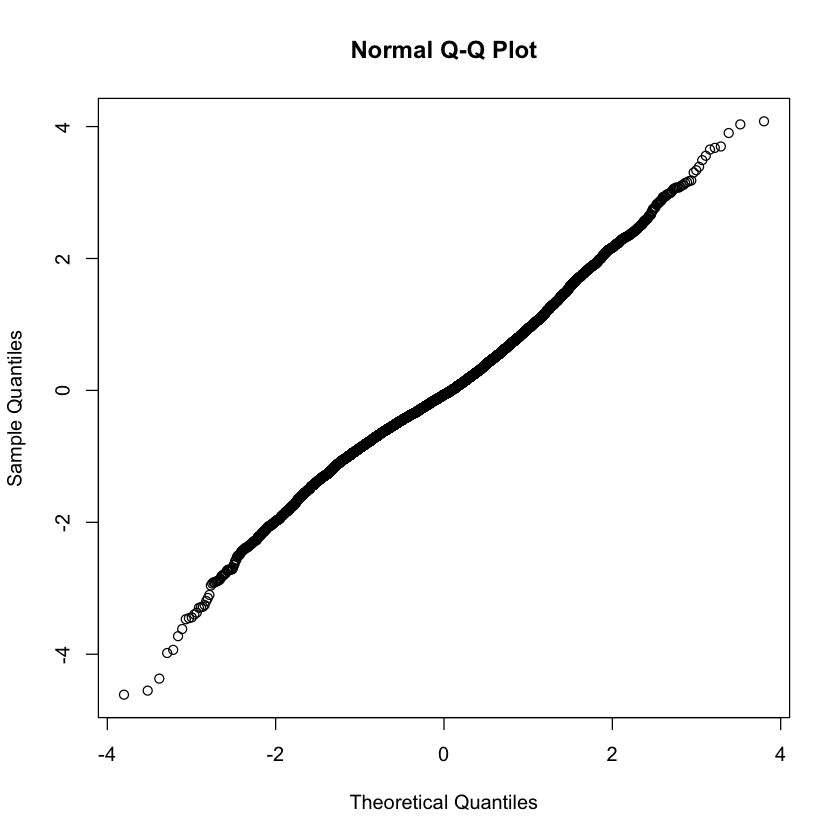

In [28]:
plot(null_model_od)
qqnorm(resid(null_model_od))

Warning message:
: ‘mode(antialias)’ differs between new and previous
	 ==> NOT changing ‘antialias’

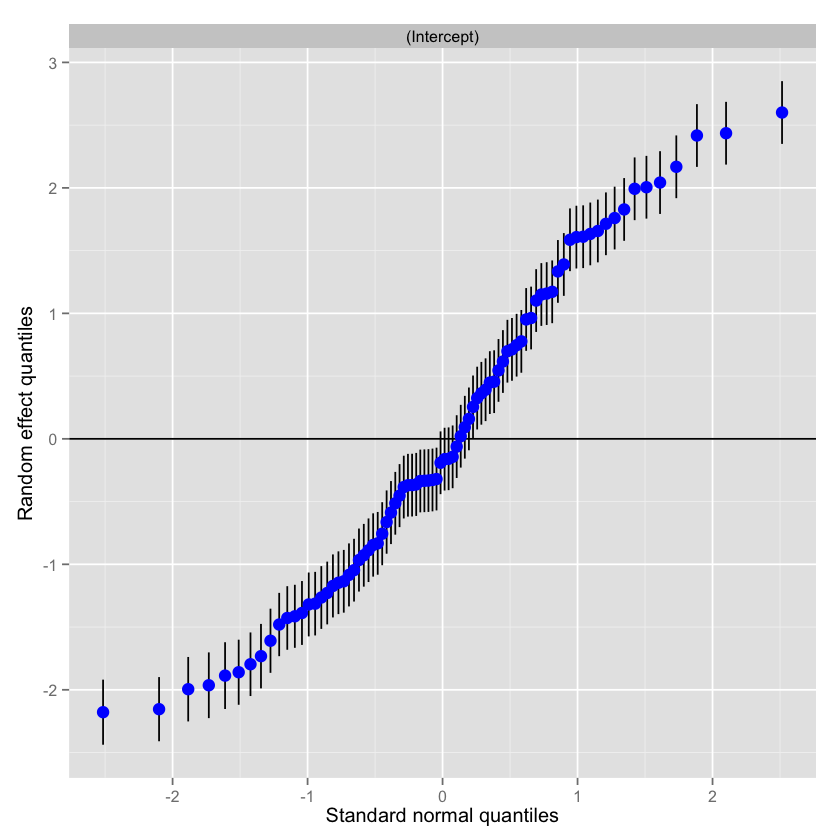

Warning message:
: ‘mode(antialias)’ differs between new and previous
	 ==> NOT changing ‘antialias’

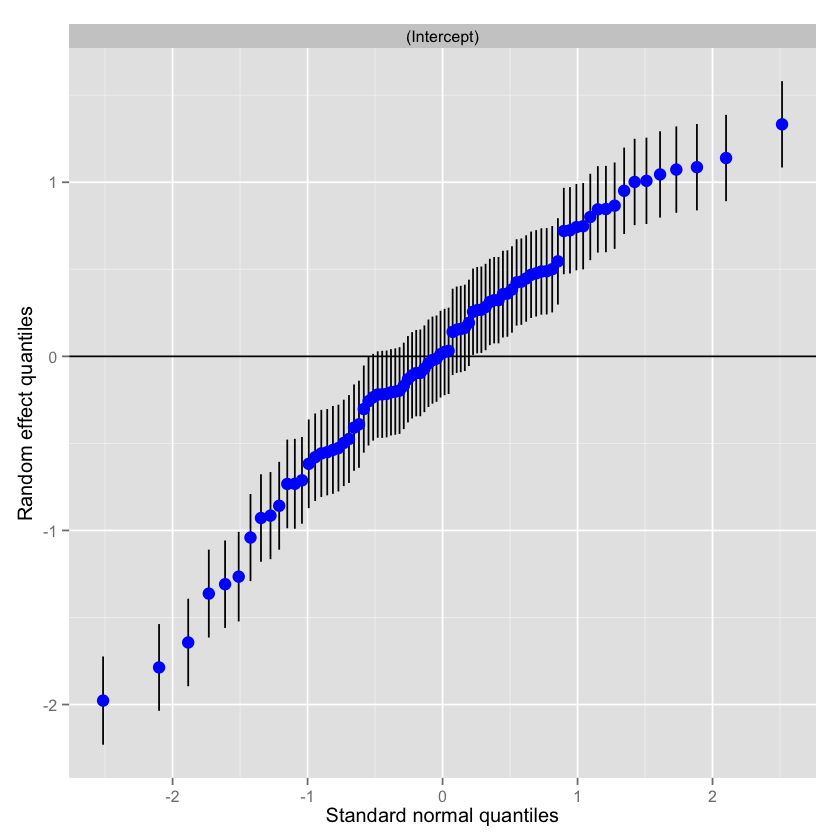

ERROR: Error in vapply(seq_along(mapped), function(i) {: values must be length 1,
 but FUN(X[[1]]) result is length 0


$mstn_id_d

$mstn_id_o


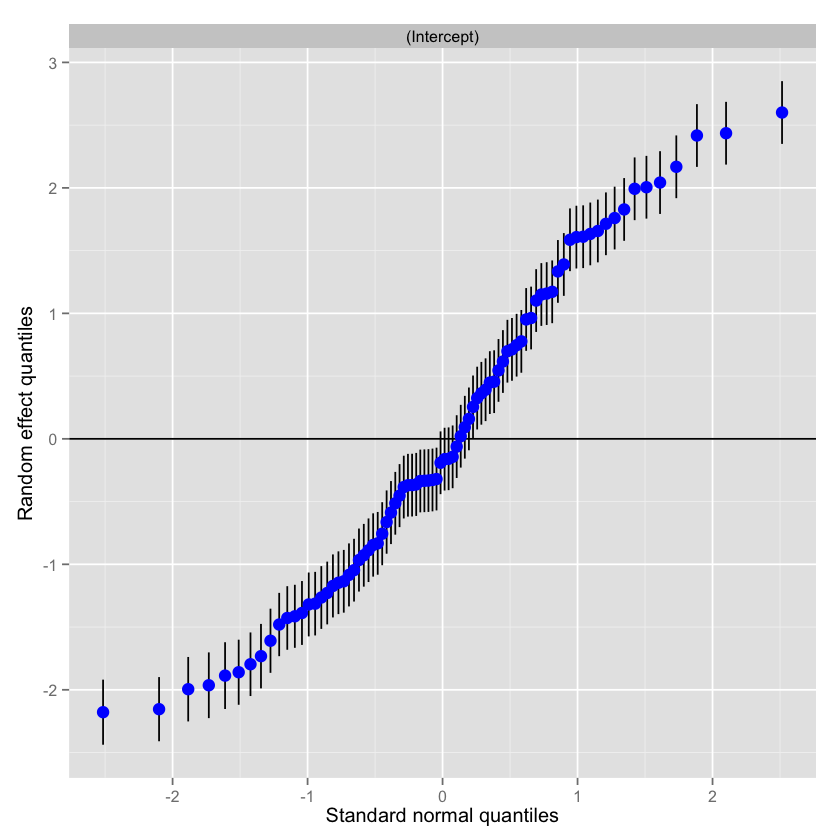

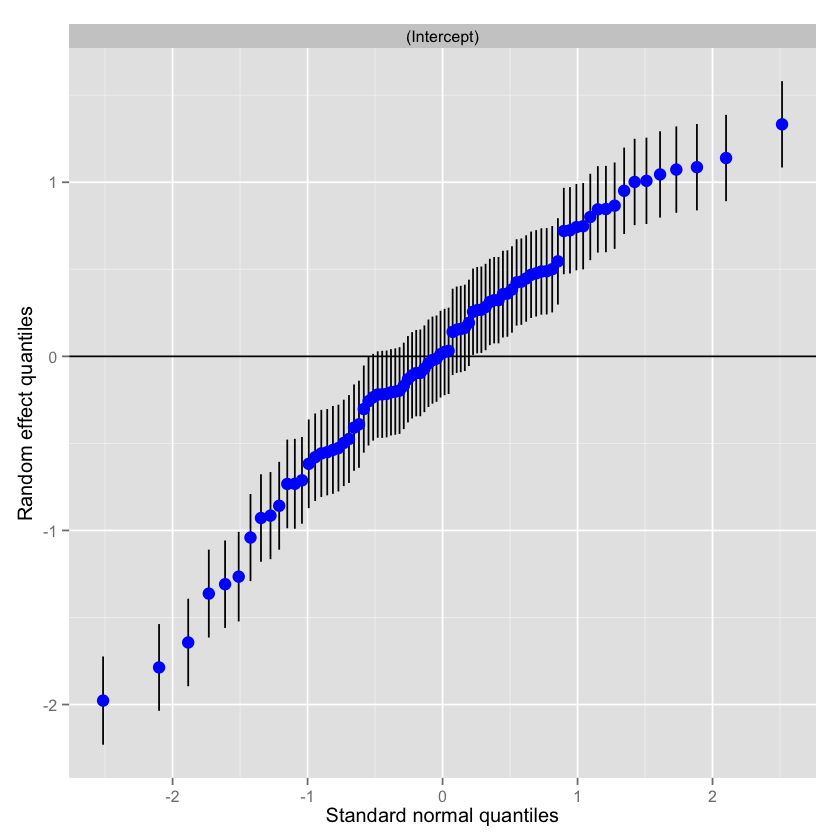

In [78]:
ggCaterpillar(ranef(null_model_od, condVar=TRUE))

the residuals look pretty random and the qqplots show the residuals and random effects are approximately normal





# Build some models

the first model adds fixed effects for each OD pair (we keep the cross-classified specification)

In [77]:
formula <- log(ridersum) ~ log(peak_fare_05) + log(off_peak_fare_05) + log(track_mile) + log(inv_comp_mile) + log1p(travel_time) + (1 | mstn_id_d) + (1 | mstn_id_o)

model_1_test<- lmer(formula, data = wmata)


In [93]:
model_1<- lmer( log(ridersum) ~ log(peak_fare_05) + log(off_peak_fare_05) + log(track_mile) + log(inv_comp_mile) + log1p(travel_time) +
                  (1 | mstn_id_d)+ (1 | mstn_id_o),
                data = wmata)

htmlreg(model_1, type="html", single.row =TRUE,custom.model.names = "Model 1")
lrtest(null_model_od, model_1)

,Model 1
(Intercept),9.71 (0.17)***
log(peak_fare_05),-1.62 (0.16)***
log(off_peak_fare_05),2.28 (0.19)***
log(track_mile),0.17 (0.12)
log(inv_comp_mile),-1.13 (0.09)***
log1p(travel_time),-2.28 (0.05)***
AIC,16441.27
BIC,16502.90
Log Likelihood,-8211.64
Num. obs.,6961


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,4,-10221.1,NA,NA,NA
2,9,-8211.636,5,4018.937,0


This is already a much better model than the null_od... we cut the residual variance in half

Model 2 adds more fixed effects to match Hiro's specification. Note that we still haven't centered any of the variables so the intercept terms don't really make sense and can't be interpreted. This is ok for the moment since we're just exploring some specifications, but eventually we'll need to center variables like `peak_fare` and `track_miles` that don't have a true zero. That way we can interpret the random intercepts as the group effects for OD pairs having the average fare and average trip duration, etc



In [92]:
model_2 <- lmer( log(ridersum) ~ log(peak_fare_05) + log(off_peak_fare_05) + log(track_mile) + log(inv_comp_mile) + log_tt_ratio2_fill + tt_ratio201 + log_parking_users + factor(redline_OD) + factor(m25_1) + factor(m25_2) + logjobshalfUp_D + log_tphpeakv2_D + log_buslinescount_D + log_ParkingCapacityNew_O + log_hh_o + log_buslinescount_O +
                   + log1p(travel_time) + log(MedianHHIncome_O) +
                   (1 | mstn_id_o) + (1 | mstn_id_d),
                 data = wmata)

htmlreg(list(model_1, model_2), type="html",single.row =TRUE, custom.model.names = c("Model 1","Model 2"))
lrtest(model_1, model_2)

,Model 1,Model 2
(Intercept),9.71 (0.17)***,1.70 (1.94)
log(peak_fare_05),-1.62 (0.16)***,-1.51 (0.15)***
log(off_peak_fare_05),2.28 (0.19)***,1.68 (0.19)***
log(track_mile),0.17 (0.12),0.12 (0.13)
log(inv_comp_mile),-1.13 (0.09)***,-0.84 (0.11)***
log1p(travel_time),-2.28 (0.05)***,-1.65 (0.06)***
log_tt_ratio2_fill,,0.29 (0.03)***
tt_ratio201,,-0.81 (0.09)***
log_parking_users,,0.27 (0.01)***
factor(redline_OD)1,,0.53 (0.04)***


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,9,-8211.636,NA,NA,NA
2,22,-7854.303,13,714.6666,2.520761e-144


#### Now we can try some random coefficients

model 3 allows the coefficient for origin households to vary randomly (by origin)

In [91]:
model_3 <- lmer( log(ridersum) ~ log(peak_fare_05) + log(off_peak_fare_05) + log(track_mile) + log(inv_comp_mile) + log_tt_ratio2_fill + tt_ratio201 + log_parking_users + factor(redline_OD) + factor(m25_1) + factor(m25_2) + logjobshalfUp_D + log_tphpeakv2_D + log_buslinescount_D + log_ParkingCapacityNew_O + log_hh_o + log_buslinescount_O +
                   + log1p(travel_time) + log(MedianHHIncome_O) +
                   (1 + log_hh_o| mstn_id_o) + (1 | mstn_id_d),
                 data = wmata)

htmlreg(model_3, type="html", single.row =TRUE,custom.model.names = "Model 3")
lrtest(model_2, model_3)



,Model 3
(Intercept),4.07 (1.74)*
log(peak_fare_05),-1.50 (0.15)***
log(off_peak_fare_05),1.68 (0.19)***
log(track_mile),0.12 (0.13)
log(inv_comp_mile),-0.84 (0.11)***
log_tt_ratio2_fill,0.28 (0.03)***
tt_ratio201,-0.81 (0.09)***
log_parking_users,0.27 (0.01)***
factor(redline_OD)1,0.53 (0.04)***
factor(m25_1)1,0.37 (0.13)**


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,22,-7854.303,NA,NA,NA
2,24,-7851.404,2,5.796657,0.05511526


not a huge difference. lets try only a random coefficient for destination jobs

In [95]:
model_4 <- lmer( log(ridersum) ~ log(peak_fare_05) + log(off_peak_fare_05) + log(track_mile) + log(inv_comp_mile) + log_tt_ratio2_fill + tt_ratio201 + log_parking_users + factor(redline_OD) + factor(m25_1) + factor(m25_2) + logjobshalfUp_D + log_tphpeakv2_D + log_buslinescount_D + log_ParkingCapacityNew_O + log_hh_o + log_buslinescount_O +
                   + log1p(travel_time) + log(MedianHHIncome_O) +
                   (1 | mstn_id_o) + (1 + logjobshalfUp_D | mstn_id_d),
                 data = wmata)
lrtest(model_2, model_4)
lrtest(model_3, model_4)

,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,22,-7854.303,NA,NA,NA
2,24,-7844.447,2,19.71043,5.247274e-05


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,24,-7851.404,NA,NA,NA
2,24,-7844.447,0,13.91378,0


the random jobs coefficient outperforms the random households coefficient


now a model with both of the random coefficients we tried

In [65]:
model_5 <- lmer( log(ridersum) ~ log(peak_fare_05) + log(off_peak_fare_05) + log(track_mile) + log(inv_comp_mile) + log_tt_ratio2_fill + tt_ratio201 + log_parking_users + factor(redline_OD) + factor(m25_1) + factor(m25_2) + logjobshalfUp_D + log_tphpeakv2_D + log_buslinescount_D + log_ParkingCapacityNew_O + log_hh_o + log_buslinescount_O +
                   + log1p(travel_time) + log(MedianHHIncome_O) +
                   (1 + log_hh_o | mstn_id_o) + (1 + logjobshalfUp_D | mstn_id_d),
                 data = wmata)
lrtest(model_2, model_5)
lrtest(model_4, model_5)

,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,22,-7854.303,NA,NA,NA
2,26,-7841.505,4,25.59589,3.817131e-05


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
1,24,-7844.447,NA,NA,NA
2,26,-7841.505,2,5.885458,0.05272164


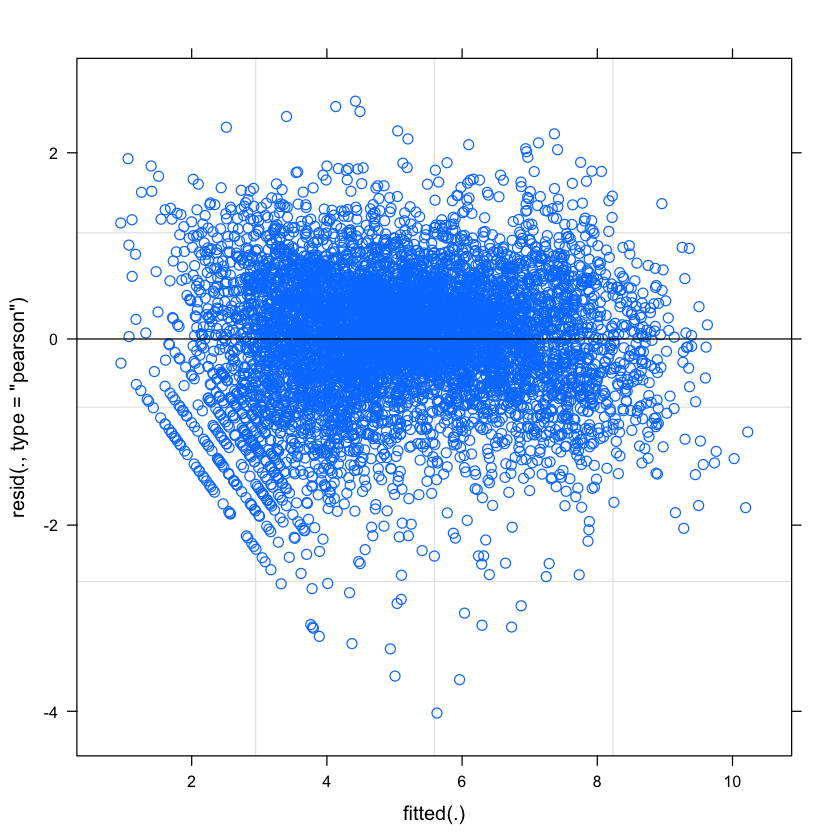

Warning message:
: ‘mode(antialias)’ differs between new and previous
	 ==> NOT changing ‘antialias’

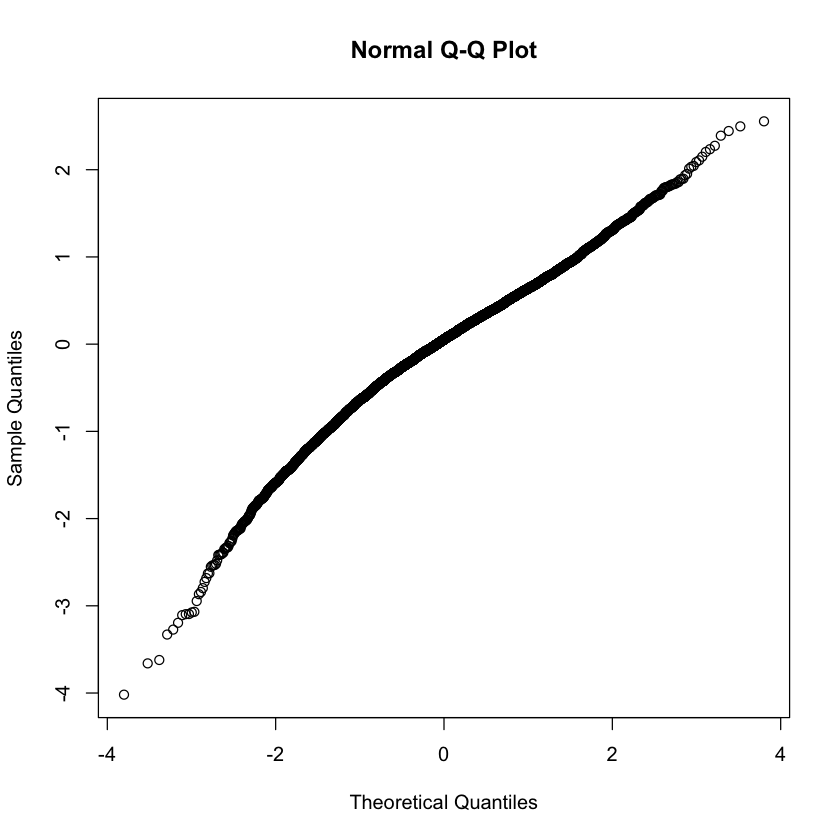

Warning message:
: ‘mode(antialias)’ differs between new and previous
	 ==> NOT changing ‘antialias’

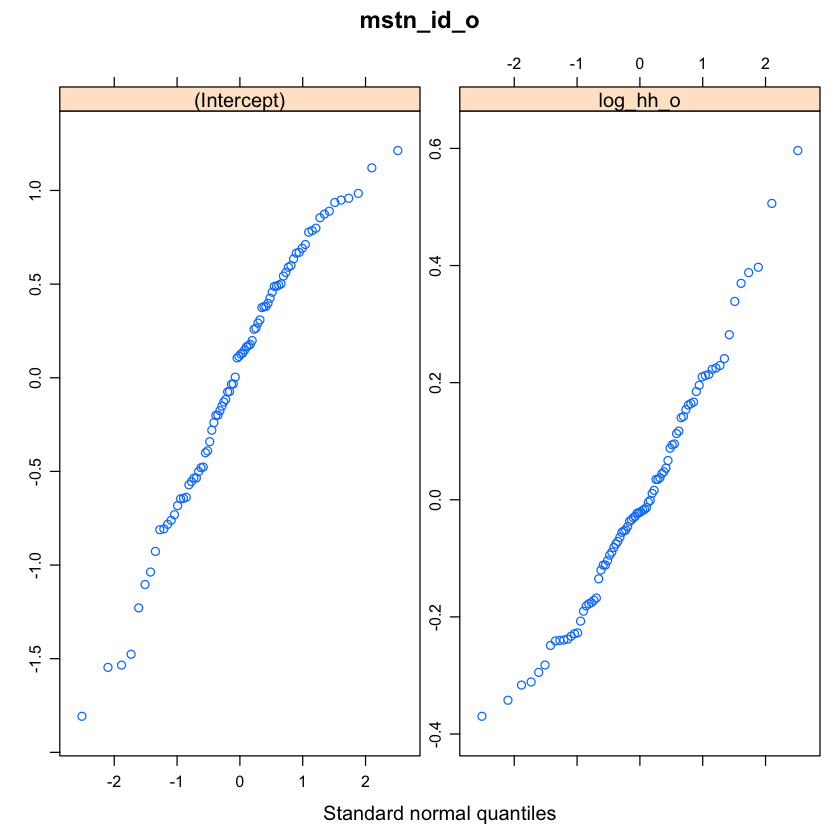

Warning message:
: ‘mode(antialias)’ differs between new and previous
	 ==> NOT changing ‘antialias’

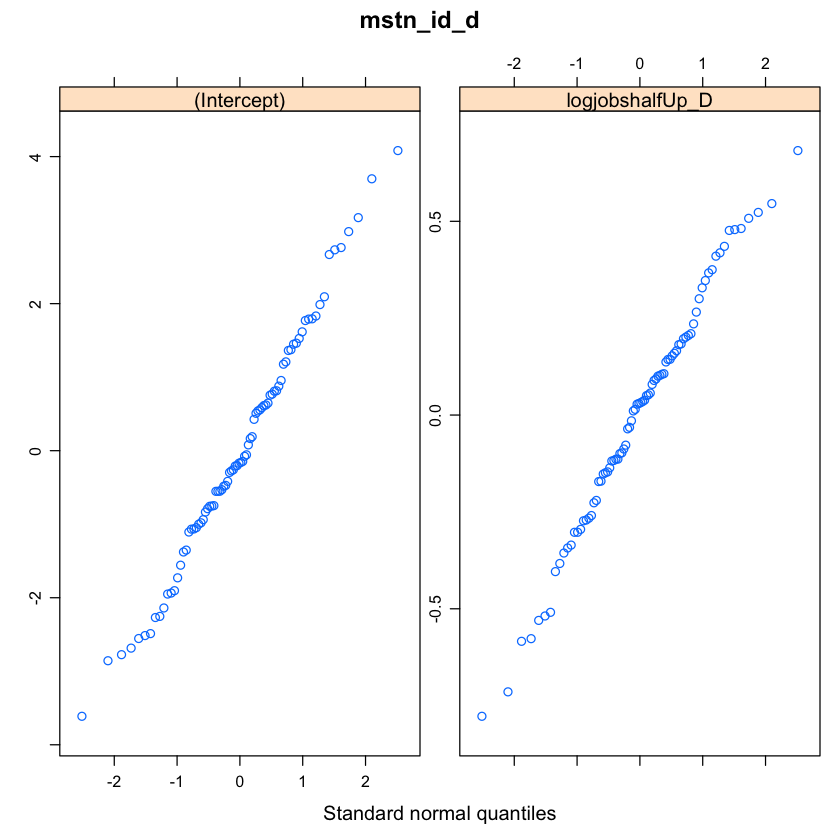

ERROR: Error in vapply(seq_along(mapped), function(i) {: values must be length 1,
 but FUN(X[[1]]) result is length 0


$mstn_id_o

$mstn_id_d


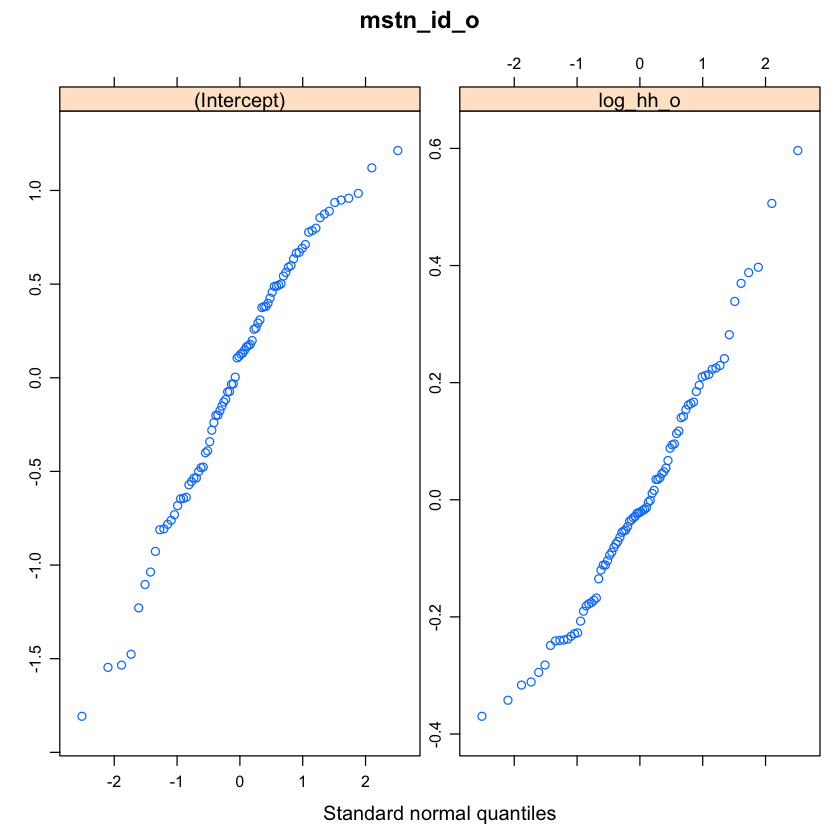

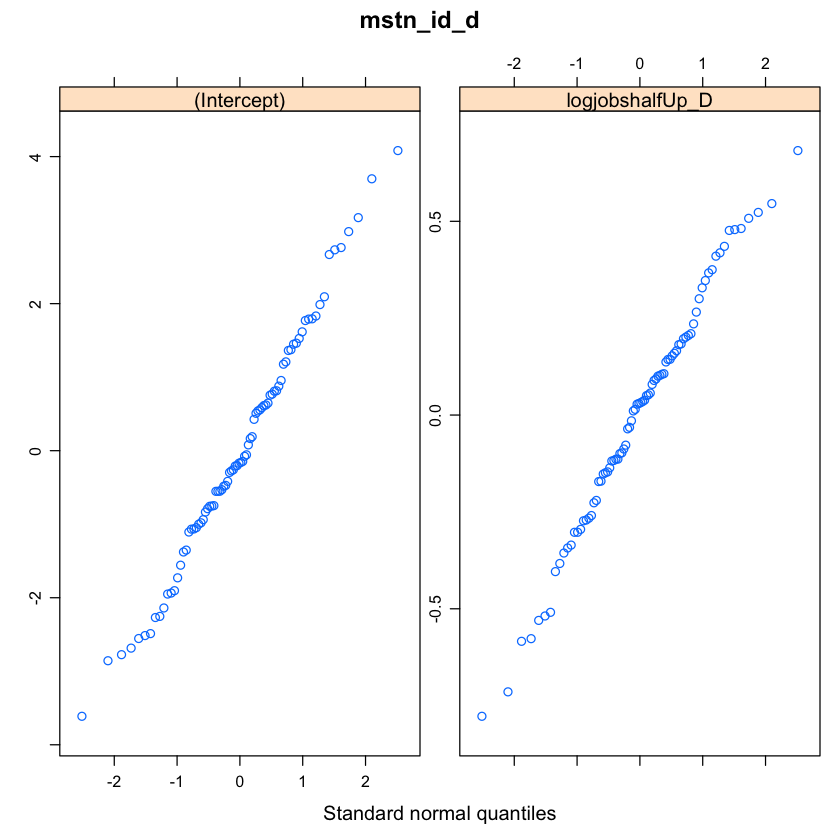

In [100]:
plot(model_5)
qqnorm(resid(model_5))
qqmath(ranef(model_5))

In [97]:
htmlreg(list(null_model_od, model_1, model_2, model_3,model_4, model_5),single.row =TRUE, caption = "Model Comparison", custom.model.names =c("Null", "Reduced", "Full", "Random HH", "Random Jobs", "Dual Random"))

,Null,Reduced,Full,Random HH,Random Jobs,Dual Random
(Intercept),5.05 (0.16)***,9.71 (0.17)***,1.70 (1.94),4.07 (1.74)*,1.49 (1.90),3.82 (1.70)*
log(peak_fare_05),,-1.62 (0.16)***,-1.51 (0.15)***,-1.50 (0.15)***,-1.55 (0.15)***,-1.54 (0.15)***
log(off_peak_fare_05),,2.28 (0.19)***,1.68 (0.19)***,1.68 (0.19)***,1.72 (0.19)***,1.72 (0.19)***
log(track_mile),,0.17 (0.12),0.12 (0.13),0.12 (0.13),0.11 (0.13),0.11 (0.13)
log(inv_comp_mile),,-1.13 (0.09)***,-0.84 (0.11)***,-0.84 (0.11)***,-0.84 (0.11)***,-0.85 (0.11)***
log1p(travel_time),,-2.28 (0.05)***,-1.65 (0.06)***,-1.65 (0.06)***,-1.64 (0.06)***,-1.64 (0.06)***
log_tt_ratio2_fill,,,0.29 (0.03)***,0.28 (0.03)***,0.29 (0.03)***,0.29 (0.03)***
tt_ratio201,,,-0.81 (0.09)***,-0.81 (0.09)***,-0.83 (0.09)***,-0.83 (0.09)***
log_parking_users,,,0.27 (0.01)***,0.27 (0.01)***,0.27 (0.01)***,0.27 (0.01)***
factor(redline_OD)1,,,0.53 (0.04)***,0.53 (0.04)***,0.52 (0.04)***,0.52 (0.04)***


So far, the results show that we definitely want to include a cross-classified specification, and that both random intercepts are significant. We get much better likelihoods and fit criteria moving from the null model to model 2.

In models 3, 4, and 5, we add random coefficients, and although the likelihoods get a little better, they only get marginally better--and we stop explaining additional variance, the residual is stable at .50. In fact the likelihood ratio test between models 4 and 5 is just barely insignificant. This means that allowing coefficient for destination jobs to vary adds information, but *also* allowing origin households to vary does not add much.
    
 Once we get the fixed effects specified well, I think we'll be in really good shape   